In [1]:
import scanpy as sc

In [2]:
import anndata
import os
import pandas as pd
import numpy as np

In [3]:
import matplotlib as mpl
import matplotlib.pyplot as plt

In [4]:
#import cell2location

In [5]:
import squidpy as sq

In [6]:
import skimage

In [7]:
import seaborn as sns

In [8]:
#sc.settings.figdir = figures_dir
#sq.settings.figdir = figures_dir

In [9]:
sc.set_figure_params(figsize=(10,10))

In [10]:
#sq.set_figure_params(figsize=(10,10))

In [11]:
data_dir = ''

In [12]:
spatial_data_dir = os.path.join(data_dir, 'spatial_data')

In [53]:
library_id = 'CytAssist_FFPE_Human_Skin_Melanoma'

#### Load data

In [54]:
data_dir_10x = os.path.join(spatial_data_dir, 'melanoma_10x')

In [55]:
adata = sq.read.visium(data_dir_10x, library_id=library_id, counts_file=f'{library_id}_filtered_feature_bc_matrix.h5')

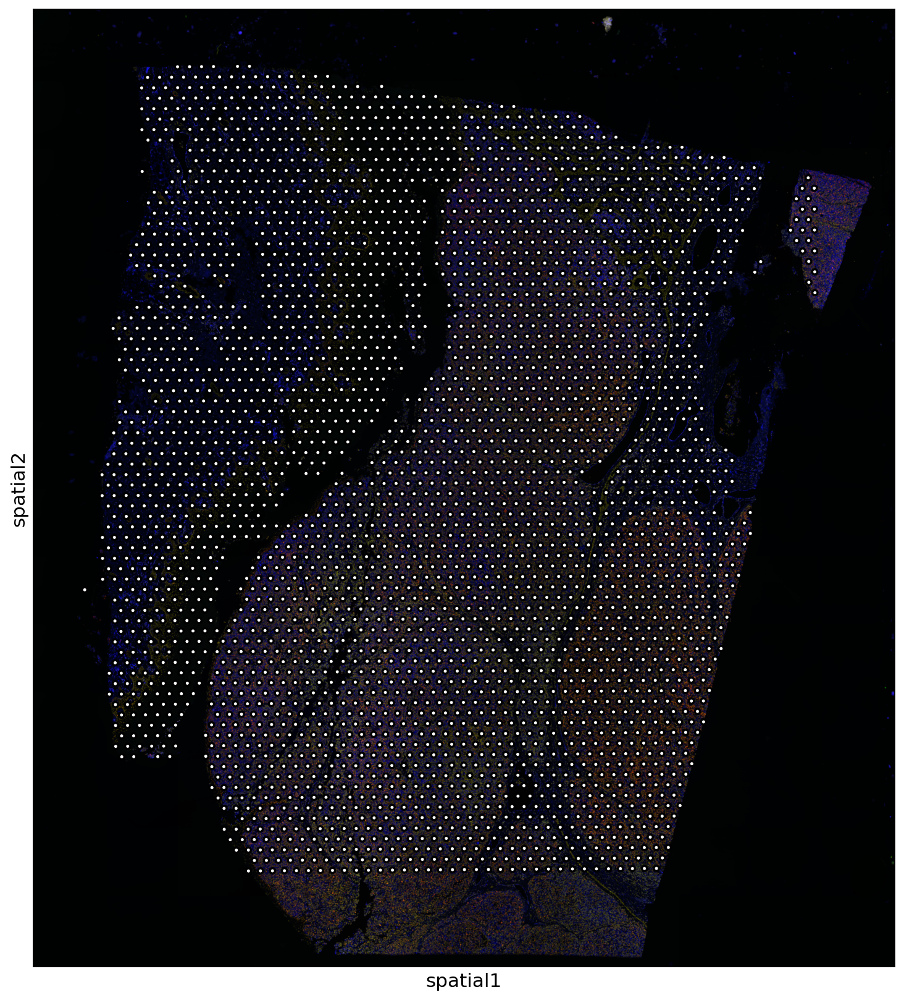

In [56]:
sq.pl.spatial_scatter(adata, outline=True, size=0.3)

In [57]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

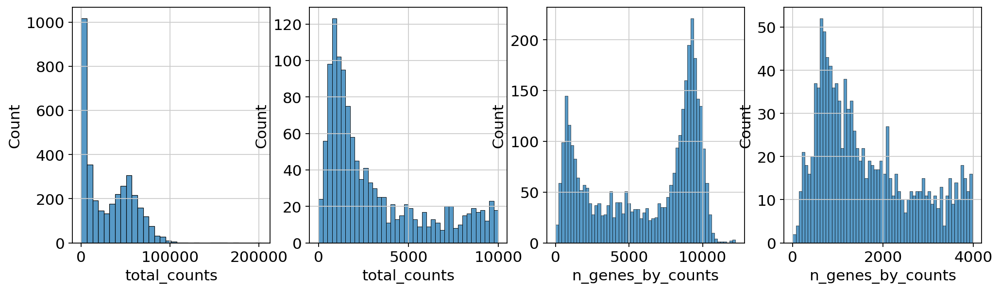

In [58]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=40, ax=axs[1])
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000], kde=False, bins=60, ax=axs[3])

In [59]:
sc.pp.filter_cells(adata, min_counts=1000)
#sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20]
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

#cells after MT filter: 3154


In [60]:
adata

AnnData object with n_obs × n_vars = 3154 × 18040
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'

In [61]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

In [1]:
#sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)

In [63]:
img = sq.im.ImageContainer.from_adata(adata)#, img_key='spatial')

In [64]:
img

ImageContainer[shape=(2000, 1801), layers=['hires']]

In [65]:
sq.im.process(img=img, layer="hires", method="smooth")
sq.im.segment(
    img=img,
    layer="hires_smooth",
    method="watershed",
    channel=0,
)

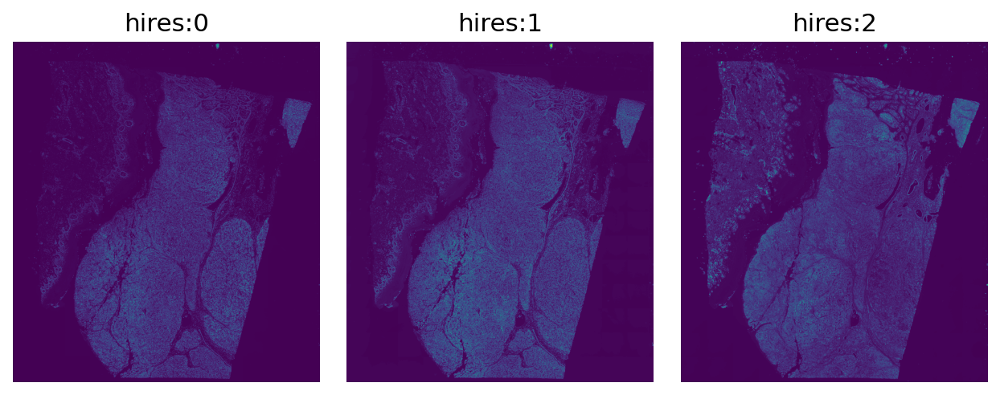

In [66]:
img.show(channelwise=True, layer='hires')

In [67]:
img

ImageContainer[shape=(2000, 1801), layers=['hires', 'hires_smooth', 'segmented_watershed']]

In [ ]:
inset_y = 0
inset_x = 0
inset_sy = 2000
inset_sx = 1801

fig, axs = plt.subplots(1, 3, figsize=(30, 10))
sq.pl.spatial_scatter(
    adata, color="clusters", alpha=0.7, frameon=False, ax=axs[0], title=""
)
axs[0].set_title("Clusters", fontdict={"fontsize": 20})
sf = adata.uns["spatial"][library_id]["scalefactors"][
    "tissue_hires_scalef"
]
"""
rect = mpl.patches.Rectangle(
    (inset_y * sf, inset_x * sf),
    width=inset_sx * sf,
    height=inset_sy * sf,
    ec="yellow",
    lw=4,
    fill=False,
)
axs[0].add_patch(rect)
"""

axs[0].axes.xaxis.label.set_visible(False)
axs[0].axes.yaxis.label.set_visible(False)

axs[1].imshow(
    img["hires"][inset_y : inset_y + inset_sy, inset_x : inset_x + inset_sx, 0, 0]
    / 65536,
    interpolation="none",
)
axs[1].grid(False)
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_title("DAPI", fontdict={"fontsize": 20})

crop = img["segmented_watershed"][
    inset_y : inset_y + inset_sy, inset_x : inset_x + inset_sx
].values.squeeze(-1)
crop = skimage.segmentation.relabel_sequential(crop)[0]
cmap = plt.cm.plasma
cmap.set_under(color="black")
axs[2].imshow(crop, interpolation="none", cmap=cmap, vmin=0.001)
axs[2].grid(False)
axs[2].set_xticks([])
axs[2].set_yticks([])
axs[2].set_title("Nucleous segmentation", fontdict={"fontsize": 20})
plt.savefig('melanoma_spatial_scatter.pdf')

In [69]:
# define image layer to use for segmentation
features_kwargs = {
    "segmentation": {
        "label_layer": "segmented_watershed",
        "props": ["label", "centroid"],
        "channels": [1, 2],
    }
}
# calculate segmentation features
sq.im.calculate_image_features(
    adata,
    img,
    layer="hires",
    key_added="image_features",
    features_kwargs=features_kwargs,
    features="segmentation",
    mask_circle=True,
)

  0%|          | 0/3154 [00:00<?, ?/s]

In [70]:
adata.obs["cell_count"] = adata.obsm["image_features"]["segmentation_label"]

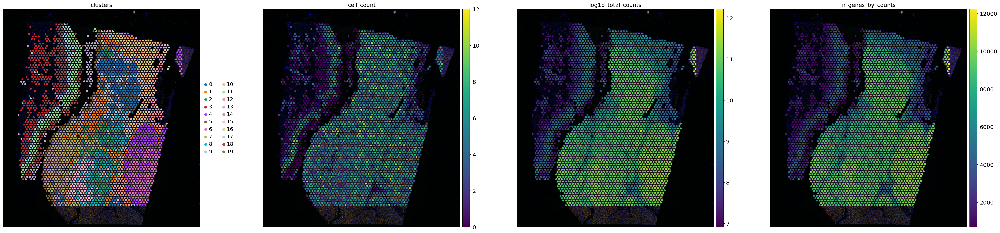

In [71]:
sq.pl.spatial_scatter(adata, color=["clusters", "cell_count", 'log1p_total_counts', 'n_genes_by_counts'], frameon=False, save='melanoma_spatial_scatter.pdf')

In [72]:
adata

AnnData object with n_obs × n_vars = 3154 × 18040
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters', 'cell_count'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors'
    obsm: 'spatial', 'X_pca', 'X_umap', 'image_features'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [35]:
adata_sc = sc.read(os.path.join(data_dir, 'melanoma.h5ad'))

/fp/homes01/u01/ec-hermankn/.local/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [43]:
sc.tl.rank_genes_groups(adata_sc, groupby="nhood_group", use_raw=False)

In [73]:
markers_df = pd.DataFrame(adata_sc.uns["rank_genes_groups"]["names"]).iloc[0:100, :]
genes_sc = np.unique(markers_df.melt().value.values)
genes_st = adata.var_names.values
genes = list(set(genes_sc).intersection(set(genes_st)))
len(genes)

987

In [74]:
marker_dict = {x : list(markers_df[x][:3]) for x in markers_df.columns}

In [75]:
adata

AnnData object with n_obs × n_vars = 3154 × 18040
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters', 'cell_count'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors'
    obsm: 'spatial', 'X_pca', 'X_umap', 'image_features'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [41]:
#adata.write(os.path.join(spatial_data_dir, 'adata_glio10x_pp.h5ad'))

In [76]:
import tangram as tg

In [77]:
tg.pp_adatas(adata_sc, adata, genes=genes)

INFO:root:987 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:16110 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.


In [78]:
import torch

In [79]:
ad_map = tg.map_cells_to_space(
    adata_sc,
    adata,
    mode="constrained",
    target_count=adata.obs.cell_count.sum(),
    density_prior=(np.array(adata.obs.cell_count) / adata.obs.cell_count.sum()),
    num_epochs=1000,
    device=torch.cuda.current_device(),
)

INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 987 genes and customized density_prior in constrained mode...


Score: 0.522, KL reg: 0.244, Count reg: 381.342, Lambda f reg: 5950.685
Score: 0.809, KL reg: 0.005, Count reg: 2.293, Lambda f reg: 858.657
Score: 0.821, KL reg: 0.003, Count reg: 0.156, Lambda f reg: 216.569
Score: 0.823, KL reg: 0.003, Count reg: 0.062, Lambda f reg: 107.986
Score: 0.824, KL reg: 0.003, Count reg: 0.029, Lambda f reg: 67.803
Score: 0.825, KL reg: 0.003, Count reg: 0.015, Lambda f reg: 47.646
Score: 0.825, KL reg: 0.003, Count reg: 0.010, Lambda f reg: 35.734
Score: 0.826, KL reg: 0.003, Count reg: 0.006, Lambda f reg: 28.017
Score: 0.826, KL reg: 0.003, Count reg: 0.006, Lambda f reg: 22.699
Score: 0.826, KL reg: 0.003, Count reg: 0.005, Lambda f reg: 18.863


INFO:root:Saving results..


In [49]:
tg.project_cell_annotations(ad_map, adata, annotation="level2_cell_type_new")

INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


In [80]:
tg.project_cell_annotations(ad_map, adata, annotation="nhood_group")

INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


In [50]:
#adata.obs = pd.concat([adata.obs, adata.obsm["tangram_ct_pred"]], axis=1)

In [81]:
adata.obs[adata.obsm["tangram_ct_pred"].columns] = adata.obsm["tangram_ct_pred"]

In [325]:
#adata.obs

In [84]:
tg.create_segment_cell_df(adata)

INFO:root:cell segmentation dataframe is saved in `uns` `tangram_cell_segmentation` of the spatial AnnData.
INFO:root:spot centroids is saved in `obsm` `tangram_spot_centroids` of the spatial AnnData.


In [54]:
adata.uns["tangram_cell_segmentation"].head()

,spot_idx,y,x,centroids
0,AACACTTGGCAAGGAA-1,738.000000,1144.324855,AACACTTGGCAAGGAA-1_0
1,AACACTTGGCAAGGAA-1,741.788509,1134.000000,AACACTTGGCAAGGAA-1_1
2,AACACTTGGCAAGGAA-1,747.343669,1151.000000,AACACTTGGCAAGGAA-1_2
3,AACACTTGGCAAGGAA-1,755.000000,1141.668490,AACACTTGGCAAGGAA-1_3
4,AACAGGATTCATAGTT-1,1091.822339,1193.000000,AACAGGATTCATAGTT-1_0


In [85]:
tg.count_cell_annotations(
    ad_map,
    adata_sc,
    adata,
    annotation="nhood_group",
)

INFO:root:spatial cell count dataframe is saved in `obsm` `tangram_ct_count` of the spatial AnnData.


In [107]:
adata_segment = tg.deconvolve_cell_annotations(adata)

In [86]:
adata_segment_nhood_new = tg.deconvolve_cell_annotations(adata)

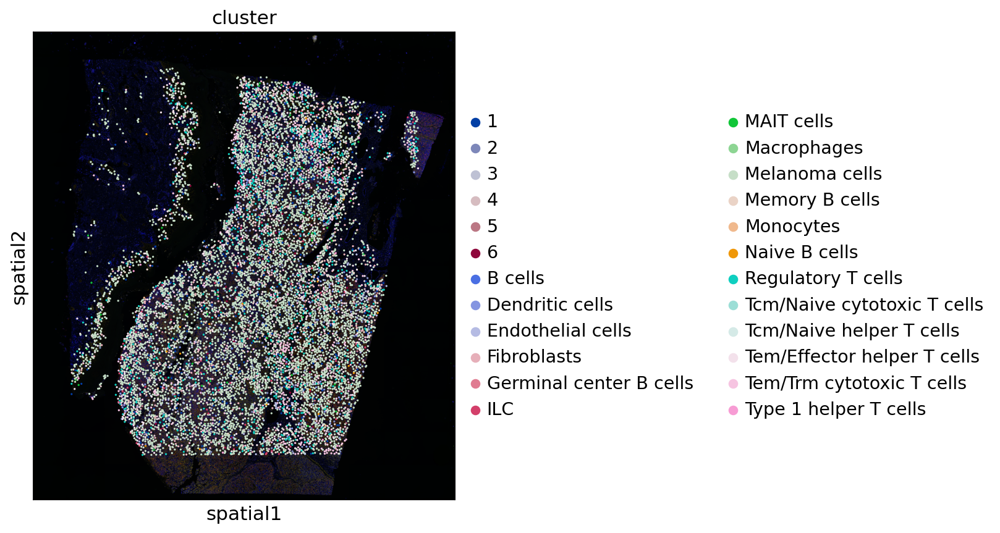

In [89]:
sq.pl.spatial_scatter(adata_segment_nhood_new, color='cluster', scale_factor=1.0, size=0.04, 
                      img_res_key='hires')

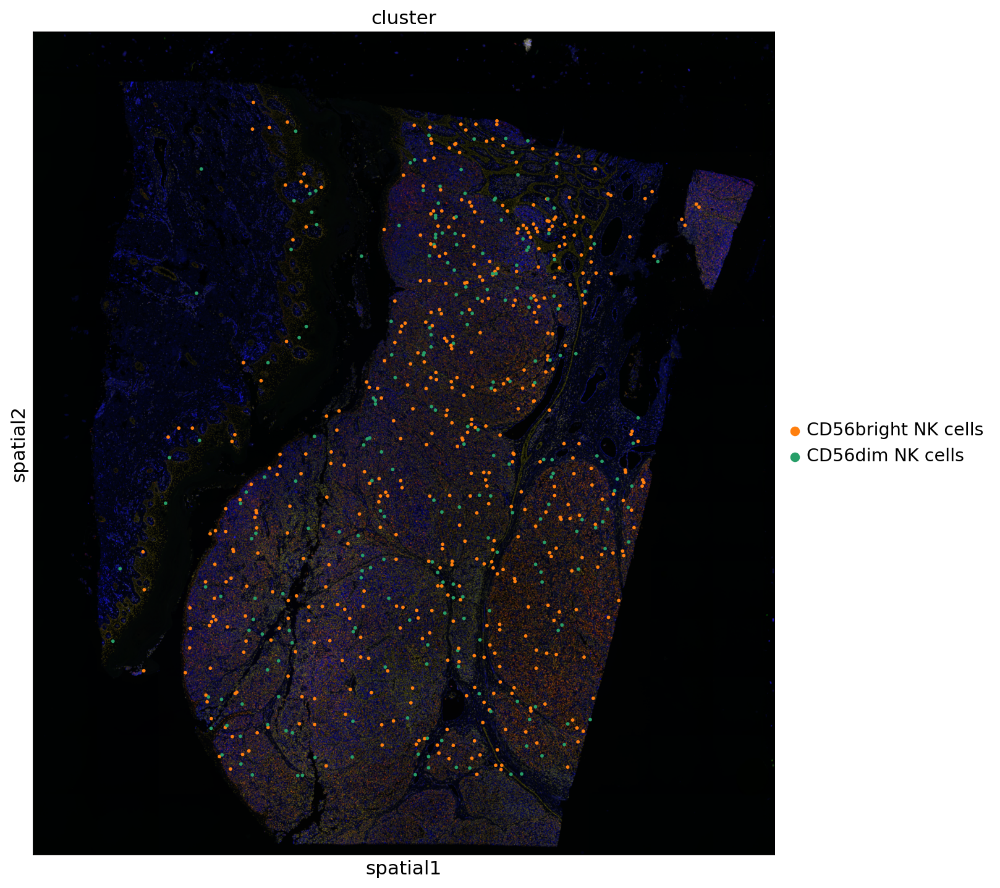

In [374]:
sq.pl.spatial_scatter(adata_segment, color='cluster', scale_factor=1.0, size=0.04, 
                      img_res_key='hires', groups=['CD56bright NK cells', 'CD56dim NK cells'])